In [164]:
using Plots, PlotThemes, LaTeXStrings
using OffsetArrays
using SparseArrays
using FFTW
using StatsBase
using Unitful
using Base: Fix1, Fix2
using Distributions

gr()

theme(:juno)
default(;palette=:seaborn_pastel6, background_color="#1b3041", fontfamily="serif")
j=im

im

In [165]:
N = 100000
start_t = 140

σ2 = 10

d = Normal(0, sqrt(σ2))

y = rand(d, N) .+ j.*rand(d, N);

In [166]:
function delay_and_correlate(y, idx, R, L)
    x1 = y[idx:idx+R]
    x2 = y[idx+L:idx+R+L]
    return x1'*x2
end

delay_and_correlate (generic function with 1 method)

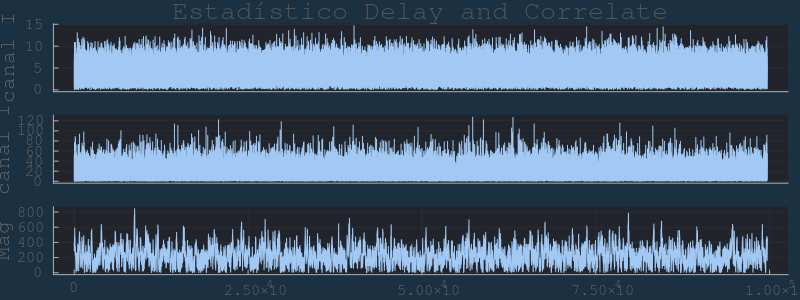

In [167]:
R=160
L=R
est2 = vcat([delay_and_correlate(y, i, R,L) for i in 1:length(y)-R-L], zeros(R+L)) .|> abs

stuff = abs.(y) .* abs.(vcat(y[length(y)-L:end],y[1:length(y)-L-1]))

p1 = plot(abs.(y[1:length(y)-R-L]), xticks=false, line=:steppost, ylabel="canal I", xlabel="", title="Estadístico Delay and Correlate")
p2 = plot(stuff, xticks=false, line=:steppost, ylabel="canal I", xlabel="")
p3 = plot(est2[1:length(y)-R-L], line=:steppost, ylabel="Mag", xlabel="", grid=true)

plot(p1, p2, p3, layout=(3,1), legend = false, size=(800,300), background_color="#1b3041")

In [168]:
using Statistics

σ2_r = (4-π)/2*σ2
μ_r = sqrt(π*σ2/2)

println(sqrt(σ2_r))
println(std(abs.(y)))

2.0717231311280555
2.0739398141632206


In [169]:
σ2_s = σ2_r^2+2*σ2_r*μ_r^2
μ_s = μ_r^2

println(μ_s)
println(mean(stuff))
println(sqrt(σ2_s))
println(std(stuff))

15.707963267948966
15.670915557609652
12.379817848933241
12.380060548946323


In [170]:
μ_est = R*μ_r^2
σ2_est = R*sqrt(σ2_s)^2
println("Media teórica: $μ_est")
println("Media experimental: $(mean(est2))")
println("Desvío teórico: $(sqrt(σ2_est))")
println("Desvío experimental: $(std(est2))")


Media teórica: 2513.2741228718346
Media experimental: 220.95870310557999
Desvío teórico: 156.5936856825414
Desvío experimental: 117.42715662218257


In [171]:
evalx = 0:maximum(est2)/100:maximum(est2)

0.0:8.438014339364912:843.8014339364912

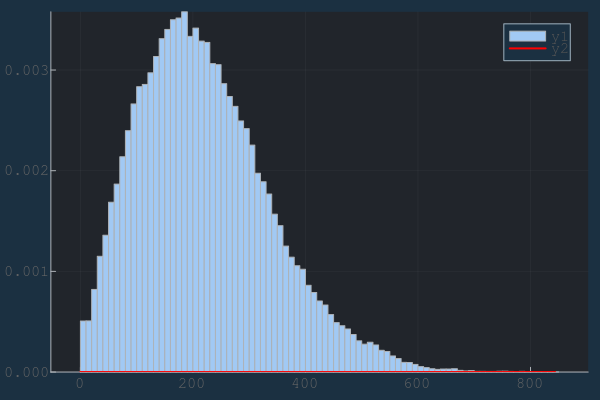

In [172]:
d_est = Normal(μ_est, sqrt(σ2_est))


p1 = histogram(est2, normalize=:pdf)
plot!(p1, evalx, pdf.(d_est, evalx), linewidth=2, linecolor=:red)

In [177]:
function run_experiment(σ2, N, R)
    d = Normal(0, sqrt(σ2))
    y = rand(d, N) .+ j.*rand(d, N)
    est2 = vcat([delay_and_correlate(y, i, R,L) for i in 1:length(y)-R-L], zeros(R+L)) .|> abs

    σ2_r = (4-π)/2*σ2
    μ_r = sqrt(π*σ2/2)
    
    σ2_s = σ2_r^2+2*σ2_r*μ_r^2
    μ_s = μ_r^2

    μ_est = R*μ_r^2
    σ2_est = R*σ2_r*(σ2_r+2*μ_r^2)

    return [μ_est, mean(est2), sqrt(σ2_est), std(est2)]
end

run_experiment (generic function with 1 method)

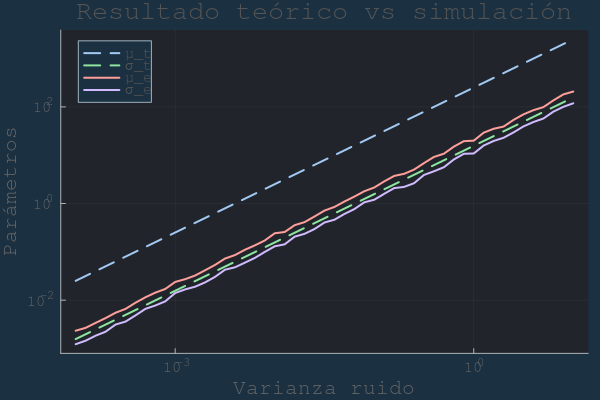

In [178]:
noises = 10.0 .^ (-4:0.1:1)

results = mapreduce(permutedims, vcat, run_experiment.(noises,10000, 160));

p1 = plot(noises, results[:,1], yaxis=:log, xaxis=:log, label="μ_t", linewidth=2, legend=:topleft, linestyle=:dash)
plot!(p1, noises, results[:,3], yaxis=:log, xaxis=:log, label="σ_t", linewidth=2, legend=:topleft, linestyle=:dash)
plot!(p1, noises, results[:,2], yaxis=:log, xaxis=:log, label="μ_e", linewidth=2, legend=:topleft)
plot!(p1, noises, results[:,4], yaxis=:log, xaxis=:log, label="σ_e", linewidth=2, legend=:topleft, title="Resultado teórico vs simulación", ylabel="Parámetros", xlabel="Varianza ruido")

NOTAS:

Estadistico banco correladores 

Encontrar f(phi|H0)
Pensar f(phi|H1)

P_FA = int_T^ing f(phi|H0)dpi

Distinto umbr4al para vada Deltaf_i


generar ruido realizaciones de largo del preambulo con un deltaF
Ej PFA=|0^-12 y sacar T

hacer experimento y comparar con cuenta teórica